*   ベースディレクトリと、出力ディレクトリを設定します。

In [12]:
############################################
BaseDir      = 'IntroDDSJpn/Chap03/'
OutputDir    = '3L1reg-040202M2N3-L0-2-LASSO/'
FileBaseName = '3L1reg-040202M2N3-L0-2-LASSO'

*   Google Colabかどうかを判別し、このJupyter Notebookのあるディレクトリを特定します。

In [13]:
############################################
import sys
import os
############################################
def IsGoogleColab():
  if 'google.colab' in sys.modules:
    return True
  else:
    return False
############################################
if IsGoogleColab():
  #
  from google.colab import drive
  drive.mount('/content/drive')
  #
  IpynbDir = 'drive/My Drive/Colab Notebooks/' + BaseDir
else:
  #
  IpynbDir =  os.getcwd() + '/'
############################################
print( 'ipynb file path = %s' % IpynbDir )

ipynb file path = d:\home\iakai\CY\Docs\Kuma3Curriculum\2025森北出版\GitHubIntroDDSJpn\IntroDDSJpn\Chap03/


*   必要なパッケージを読み込み、ファイルの出力先のディレクトリを用意します。

In [14]:
############################################
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LightSource
import mpl_toolkits.mplot3d.art3d as art3d
from matplotlib import cm
%matplotlib inline
print('matplotlib Ver.', mpl.__version__)
#
############################################
import numpy as np
print('numpy      Ver.', np.__version__)
#
############################################
import sklearn as skl
import sklearn.linear_model as lm
print('sklearn    Ver.', skl.__version__)
#
############################################
FilePath = IpynbDir + OutputDir
print( 'FilePath = %s' % FilePath )
#
if( True != os.path.isdir(FilePath) ):
    print('  making %s' % FilePath )
    os.mkdir(FilePath)
else:
    print(' %s is exist.' % FilePath )

matplotlib Ver. 3.9.2
numpy      Ver. 1.26.4
sklearn    Ver. 1.5.2
FilePath = d:\home\iakai\CY\Docs\Kuma3Curriculum\2025森北出版\GitHubIntroDDSJpn\IntroDDSJpn\Chap03/3L1reg-040202M2N3-L0-2-LASSO/
  making d:\home\iakai\CY\Docs\Kuma3Curriculum\2025森北出版\GitHubIntroDDSJpn\IntroDDSJpn\Chap03/3L1reg-040202M2N3-L0-2-LASSO/


$M=2$, $N=3$の不良設定問題
$$
\left(
  \begin{array}{c}
    y_{1} \\
    y_{2}
  \end{array}
\right)
=
\left(
  \begin{array}{ccc}
    X_{11} & X_{12} & X_{13} \\
    X_{21} & X_{22} & X_{23}
  \end{array}
\right)
\left(
  \begin{array}{c}
    \omega_{1} \\
    \omega_{2} \\
    \omega_{3}
  \end{array}
\right)
$$

$M=2$, $N=3$の不良設定問題の例
$$
\underbrace{
  \left(
    \begin{array}{c}
      -2 \\
      3
    \end{array}
  \right)
}_{\boldsymbol{y}}
=
\underbrace{
  \left(
    \begin{array}{ccc}
      2  &  -1 & 3 \\
      -1 &  1  & 2
    \end{array}
  \right)
}_{\mathbf{X}}
\underbrace{
  \left(
    \begin{array}{c}
      \omega_{1} \\
      \omega_{2} \\
      \omega_{3}
    \end{array}
  \right)
}_{\boldsymbol{\omega}}
$$

In [15]:
############################################
M = 2
############################################
y_data = np.array( [-2, 3] )
#
X_mat = np.array( [ [2, -1, 3], [-1, 1, 2] ] )

解く連立方程式

$$
-2 = 2\,\omega_{1} - \omega_{2} + 3\,\,\omega_{3}
,\,\,\, \cdots (a)
$$

$$
3 = -\omega_{1} + \omega_{2} + 2\,\,\omega_{3}
,\,\,\,\,\,\,\, \cdots (b)
$$

* $(a)+2(b)$

$$
4 = \omega_{2} + 7\,\omega_{3},
\quad
\omega_{3}
=
\frac{4-\omega_{2}}{7},
\quad
\omega_{2}
=
4-7\,\omega_{3}
\quad
\cdots(c)
$$

* $(a)+(b)$

$$
1 = \omega_{1}+5\,\omega_{3},
\quad
\omega_{3}
=
\frac{1-\omega_{1}}{5},
\quad
\omega_{1} = 1 - 5\,\omega_{3}
\quad
\cdots(d)
$$

(a), (b)の連立方程式は次式の直線を表し、直線上のすべての$\boldsymbol{\omega}$は、$\boldsymbol{y}=\mathbf{X}\,\boldsymbol{\omega}$の関係を満たす。

$$
\frac{4-\omega_{2}}{7}
=
\frac{1-\omega_{1}}{5}
=
\omega_{3}
$$

3Dグラフを描く関数

In [16]:
############################################
omega_sub_width = 5.0
omega_sub_len   = 100
############################################
def Grf2D_omega_sub_LASSO( y_data, Xsub_mat, omega_sub_hat, alpha, label_omega1, label_omega2,
                           omega_sub_width = 5, omega_sub_len   = 100,
                           elev=15, azim=60 ):
  #
  ###################
  print( 'Xsub_mat      = ', Xsub_mat      )
  print( 'omega_sub_hat = ', omega_sub_hat )
  #
  ###################
  # グラフを描く準備
  #
  ##########
  # omega_sub の 第1要素 -> x軸
  #  表示範囲
  omega1_lim = [ (omega_sub_hat[0] - omega_sub_width), (omega_sub_hat[0] + omega_sub_width) ]
  #  omega1_limの範囲が 0 を跨ぐか?
  if (omega1_lim[0] * omega1_lim[1]) < 0:
    # 跨ぐ
    omega1s = np.linspace( omega1_lim[0], omega1_lim[1], num = omega_sub_len-1 )
    # linspace で0が割り当てられる保証は無いので、0を強制的に追加
    omega1s = np.append( omega1s, 0.0 )
    # 並べ替えておく
    omega1s = np.sort( omega1s )
  else:
    # 跨がない (0を追加しない)
    omega1s = np.linspace( omega1_lim[0], omega1_lim[1], num = omega_sub_len )
  #
  print( '%d: omega1s = %+.3f -- %+.3f' % (len(omega1s), np.amin(omega1s), np.amax(omega1s)) )
  #
  ##########
  # omega_sub の 第2要素 -> x軸
  #  表示範囲
  omega2_lim = [ (omega_sub_hat[1] - omega_sub_width), (omega_sub_hat[1] + omega_sub_width) ]
  #  omega1_limの範囲が 0 を跨ぐか?
  if (omega2_lim[0] * omega2_lim[1]) < 0:
    # 跨ぐ
    omega2s = np.linspace( omega2_lim[0], omega2_lim[1], num = omega_sub_len-1 )
    # linspace で0が割り当てられる保証は無いので、0を強制的に追加
    omega2s = np.append( omega2s, 0.0 )
    # 並べ替えておく
    omega2s = np.sort( omega2s )
  else:
    # 跨がない (0を追加しない)
    omega2s = np.linspace( omega2_lim[0], omega2_lim[1], num = omega_sub_len )
  #
  print( '%d: omega2s = %+.3f -- %+.3f' % (len(omega2s), np.amin(omega2s), np.amax(omega2s)) )
  #
  ##########
  # メッシュグリッドを用意
  omega12_1, omega12_2 = np.meshgrid( omega1s, omega2s )
  #
  ##########
  # L1ノルム
  L1norms = np.abs( omega12_1 ) + np.abs( omega12_2 )
  #
  ##########
  # L1ノルムの最小点
  argmin_idx = np.argmin( L1norms )
  #
  ##########
  # argmin_idx を omega_sub_len x omega_sub_len の位置に変換
  ( j, i ) = np.unravel_index( argmin_idx, (omega_sub_len, omega_sub_len))
  #
  print( 'MIN(L1norm) = %.3f @ i = %+.3f, j = %+.3f' % (L1norms[j,i], omega1s[i], omega2s[j]) )
  #
  ##########
  # 回帰誤差
  omega_    = np.array( [omega12_1, omega12_2] )
  #
  ys_reg    = np.zeros( ( M, omega_sub_len, omega_sub_len ) )
  ys_err    = np.zeros_like( omega12_1 )
  #
  for i in range(omega_sub_len):
    for j in range(omega_sub_len):
      ys_reg[:,i,j] = Xsub_mat @ omega_[:,i,j]
      ys_err[i,j] = ( (ys_reg[0,i,j]-y_data[0])**2 + (ys_reg[1,i,j]-y_data[1])**2 ) / ( 2 * M )
  #
  ##########
  # 回帰誤差の最小点
  argmin_idx = np.argmin(ys_err)
  #
  ##########
  # argmin_idx を omega_sub_len x omega_sub_len の位置に変換
  ( j, i ) = np.unravel_index( argmin_idx, (omega_sub_len, omega_sub_len))
  #
  print( 'MIN(Error) = %.3f @ i = %+.3f, j = %+.3f' % (ys_err[j,i], omega1s[i], omega2s[j]) )
  #
  ###################
  # グラフを描画
  plt.rcParams['font.size'] = 20
  #
  fig = plt.figure(figsize=(14, 10))
  #
  fig.subplots_adjust(left=0.0, right=1.0, top=0.95, bottom=0.05)
  #
  ax1 = fig.add_subplot( projection='3d' )
  #
  ##########
  x_min = np.amin( omega1s )
  x_max = np.amax( omega1s )
  ax1.set_xlim( x_min, x_max )
  #
  ##########
  y_min = np.amin( omega2s )
  y_max = np.amax( omega2s )
  ax1.set_ylim( y_min, y_max )
  #
  ##########
  z_min = np.amin( ys_err )
  z_max = np.amax( ys_err )
  z_width  = ( z_max - z_min ) / 2.0
  # z_bot, z_top = ax1.set_zlim( z_min - z_width/10, z_max )
  z_bot, z_top = ax1.set_zlim( z_min, z_max )
  #
  ##########
  alpha_plane = 0.5
  # omega_1 = 0 平面
  y_     = np.linspace( y_min, y_max, num = 2)
  z_     = np.linspace( z_bot, z_top, num = 2)
  Y_, Z_ = np.meshgrid( y_, z_ )
  X_     = np.zeros_like( Y_ )
  ax1.plot_surface( X_, Y_, Z_, alpha=alpha_plane, color='gray' )
  #
  ##########
  # omega_2 = 0 平面
  x_     = np.linspace( x_min, x_max, num = 2)
  z_     = np.linspace( z_bot, z_top, num = 2)
  X_, Z_ = np.meshgrid( x_, z_ )
  Y_     = np.zeros_like( X_ )
  ax1.plot_surface( X_, Y_, Z_, alpha=alpha_plane, color='gray' )
  #
  ##########
  # omega_1 = 0, omega_2 = 0 の直線
  ax1.plot( [0,0], [0,0], [z_bot, z_top], color='black', linewidth=1 )
  #
  ##########
  # 最小二乗法の誤差曲面
  # ax1.plot_surface( omega12_1, omega12_2, ys_err, alpha=0.5, color='red' )
  #
  # 最小二乗法の誤差曲面の等高線 下部に表示
  cs1 = ax1.contour( omega12_1, omega12_2, ys_err, offset=z_bot, zdir='z', cmap=cm.hot, levels=20 )
  fig.colorbar( cs1, label=r'$\frac{1}{2M}\|{\bf y-X\,\omega}\|_{2}^{2}$' )
  #
  # 誤差曲面の最小点
  # argmin_idx を omega_sub_len x omega_sub_len の位置に変換
  argmin_idx = np.nanargmin( ys_err )
  ( j, i ) = np.unravel_index( argmin_idx, (omega_sub_len, omega_sub_len))
  omega1_hat_ = omega1s[i]
  omega2_hat_ = omega2s[j]
  # 最小点の縦棒
  ax1.plot( [omega1_hat_,omega1_hat_], [omega2_hat_,omega2_hat_], [z_bot, z_top], color='red',
            linewidth=5, label=r'min[$\frac{1}{2M}\|{\bf y-X\,\omega}\|_{2}^{2}$]' )
  #            linewidth=2, label=r'min[$\frac{1}{2M}\|{\bf y-X\,\omega}\|_{2}^{2}$]' )
  #
  ##########
  # Lasso
  lasso_ = ys_err + alpha * L1norms
  #
  # zの表示範囲を超えるところは、z_topでクリップ
  lasso_[ lasso_ > z_top ] = z_top
  #
  # lasso の曲面
  ax1.plot_surface( omega12_1, omega12_2, lasso_, alpha=0.5, color='blue' )# cmap=cm.cool)#
  #
  # # lasso の等高線 上部に表示
  # cs2 = ax1.contour( omega12_1, omega12_2, lasso_, offset=z_top, zdir='z', cmap=cm.cool, levels=20)
  # fig.colorbar( cs2, label=r'$\frac{1}{2M}\|{\bf y-X\,\omega}\|_{2}^{2}+\alpha\|{\bf\omega}\|_{1}$' )
  #
  # 最小点
  argmin_idx = np.nanargmin( lasso_ )
  ( j, i ) = np.unravel_index( argmin_idx, (omega_sub_len, omega_sub_len))
  omega1_hat_ = omega1s[i]
  omega2_hat_ = omega2s[j]
  # 最小点の縦棒
  ax1.plot( [omega1_hat_,omega1_hat_], [omega2_hat_,omega2_hat_], [z_bot, z_top], color='blue',
            linewidth=5, label=r'min[$\frac{1}{2M}\|{\bf y-X\,\omega}\|_{2}^{2}+\alpha\|{\bf\omega}\|_{1}$]'  )
  #          linewidth=2, label=r'min[$\frac{1}{2M}\|{\bf y-X\,\omega}\|_{2}^{2}+\alpha\|{\bf\omega}\|_{1}$]'  )
  #
  ##########
  ax1.set_xlabel( r'$%s$' % label_omega1 )
  ax1.set_ylabel( r'$%s$' % label_omega2 )
  ax1.set_zlabel( r'$E(%s, %s)$' % ( label_omega1, label_omega2 ) )
  #
  ##########
  # 視点
  ax1.view_init( elev = elev, azim = azim )
  # ax1.set_box_aspect(( 2 * xyz_lim, 2 * xyz_lim, 2 * xyz_lim ))
  #
  ##########
  plt.legend(bbox_to_anchor=(1, 1), loc='upper right', fontsize=16)
  #
  ##########
  plt.title( r'$%s \ne 0, %s \ne 0: \alpha=%.3f$' % (label_omega1, label_omega2, alpha ) )
  #
  ##########
  plt.show()
  #
  return fig

2-1.   L0=2となる解: $\omega_{1}\ne0$, $\omega_{2}\ne0$, $\omega_{3}=0$

$$
\underbrace{
  \left(
    \begin{array}{c}
      y_{1} \\
      y_{2}
    \end{array}
  \right)
}_{\boldsymbol{y}}
=
\underbrace{
  \left(
    \begin{array}{cc}
      X_{11} & X_{12}\\
      X_{21} & X_{22}
    \end{array}
  \right)
}_{\mathbf{X}_{12}}
\underbrace{
  \left(
    \begin{array}{c}
      \omega_{1} \\
      \omega_{2}
    \end{array}
  \right)
}_{\boldsymbol{\omega}_{12}}
$$

$$
\hat{\boldsymbol{\omega}}_{12}
=
\mathbf{X}_{12}^{-1}
\boldsymbol{y}
$$

In [17]:
############################################
print( 'X_mat =\n', X_mat )
#
X12_mat = np.array( [X_mat[:,0], X_mat[:,1]] ).T
print( 'X12_mat =\n', X12_mat )
#
X12_mat_inv = np.linalg.inv( X12_mat )
#
omega12_hat = X12_mat_inv @ y_data
print( 'omega12_hat = ', omega12_hat )
#
y12_reg = X12_mat @ omega12_hat
print( 'y12_reg_err = ', y12_reg - y_data )

X_mat =
 [[ 2 -1  3]
 [-1  1  2]]
X12_mat =
 [[ 2 -1]
 [-1  1]]
omega12_hat =  [1. 4.]
y12_reg_err =  [0. 0.]


Xsub_mat      =  [[ 2 -1]
 [-1  1]]
omega_sub_hat =  [1. 4.]
100: omega1s = -4.000 -- +6.000
100: omega2s = -1.000 -- +9.000
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +1.000, j = +4.000


<>:11: SyntaxWarning: invalid escape sequence '\o'
<>:11: SyntaxWarning: invalid escape sequence '\o'
<>:11: SyntaxWarning: invalid escape sequence '\o'
<>:11: SyntaxWarning: invalid escape sequence '\o'
C:\Users\iakai\AppData\Local\Temp\ipykernel_43696\450527629.py:11: SyntaxWarning: invalid escape sequence '\o'
  fig = Grf2D_omega_sub_LASSO( y_data, Xsub_mat, omega_sub_hat, alpha, '\omega_{1}', '\omega_{2}',
C:\Users\iakai\AppData\Local\Temp\ipykernel_43696\450527629.py:11: SyntaxWarning: invalid escape sequence '\o'
  fig = Grf2D_omega_sub_LASSO( y_data, Xsub_mat, omega_sub_hat, alpha, '\omega_{1}', '\omega_{2}',


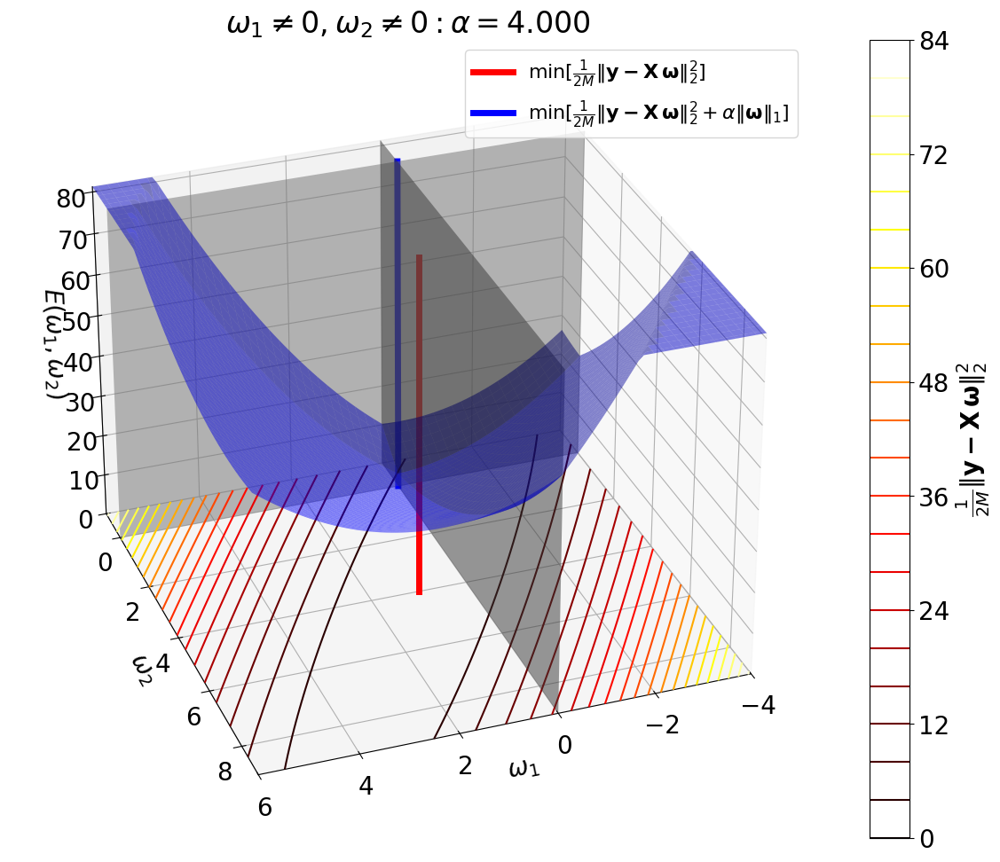

Xsub_mat      =  [[ 2 -1]
 [-1  1]]
omega_sub_hat =  [1. 4.]
100: omega1s = -4.000 -- +6.000
100: omega2s = -1.000 -- +9.000
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +1.000, j = +4.000


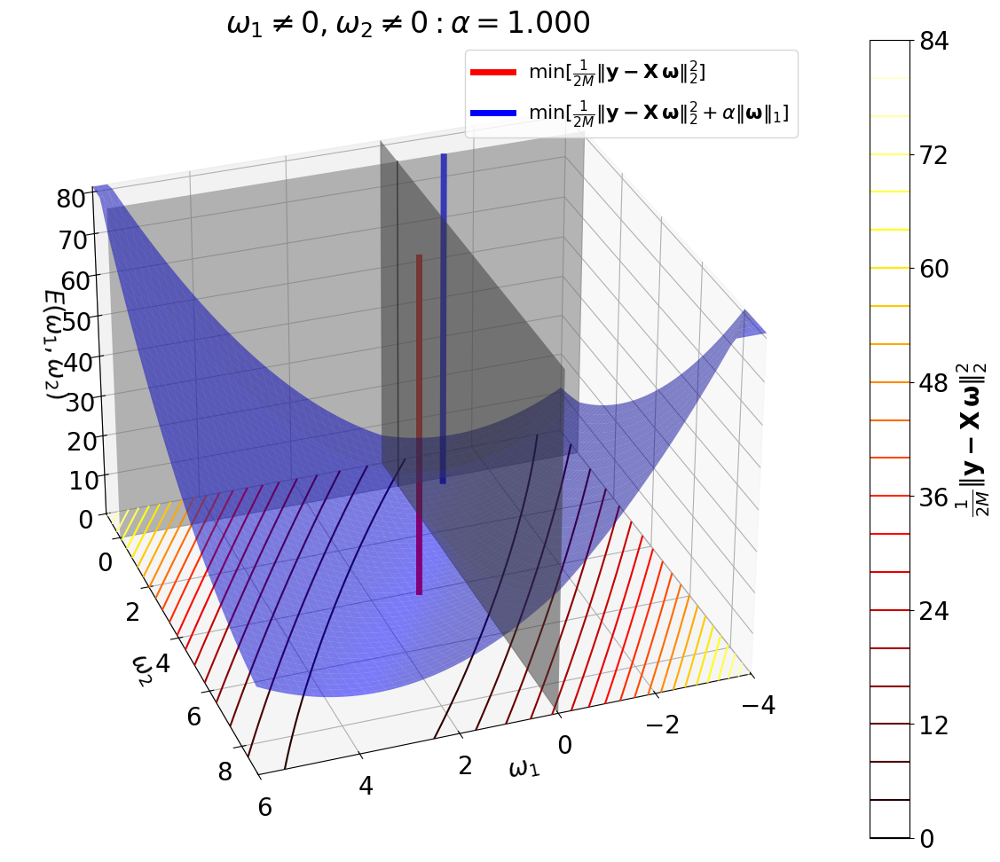

Xsub_mat      =  [[ 2 -1]
 [-1  1]]
omega_sub_hat =  [1. 4.]
100: omega1s = -4.000 -- +6.000
100: omega2s = -1.000 -- +9.000
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +1.000, j = +4.000


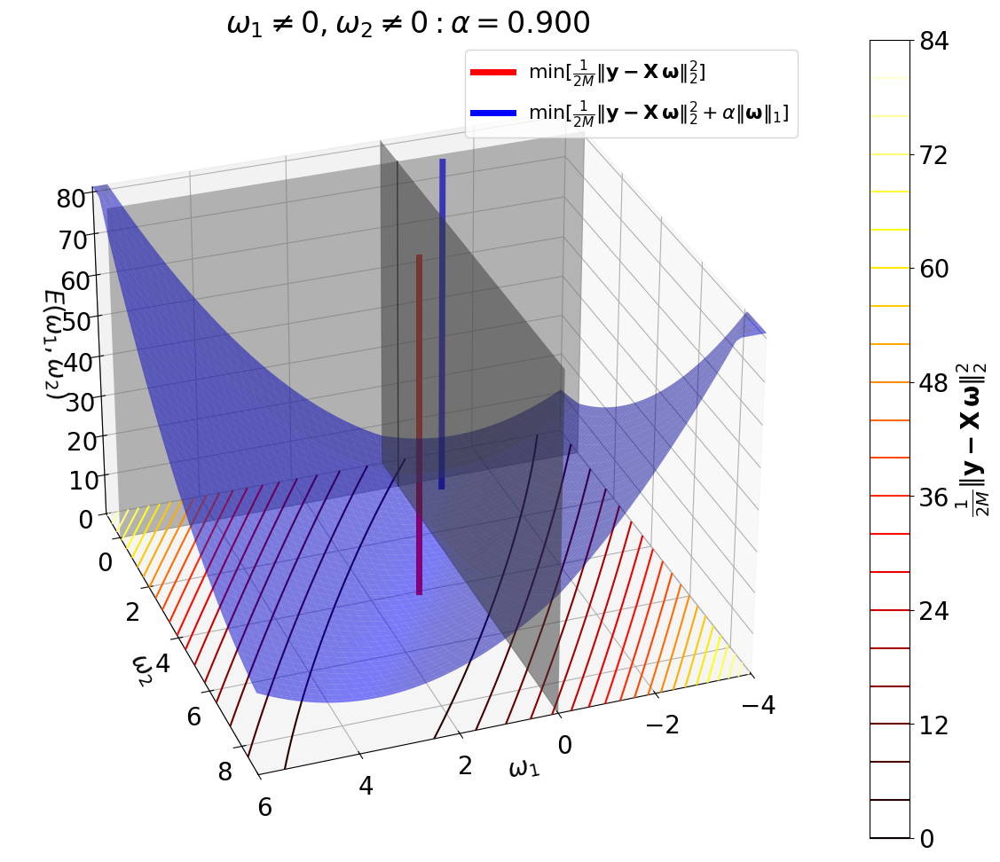

Xsub_mat      =  [[ 2 -1]
 [-1  1]]
omega_sub_hat =  [1. 4.]
100: omega1s = -4.000 -- +6.000
100: omega2s = -1.000 -- +9.000
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +1.000, j = +4.000


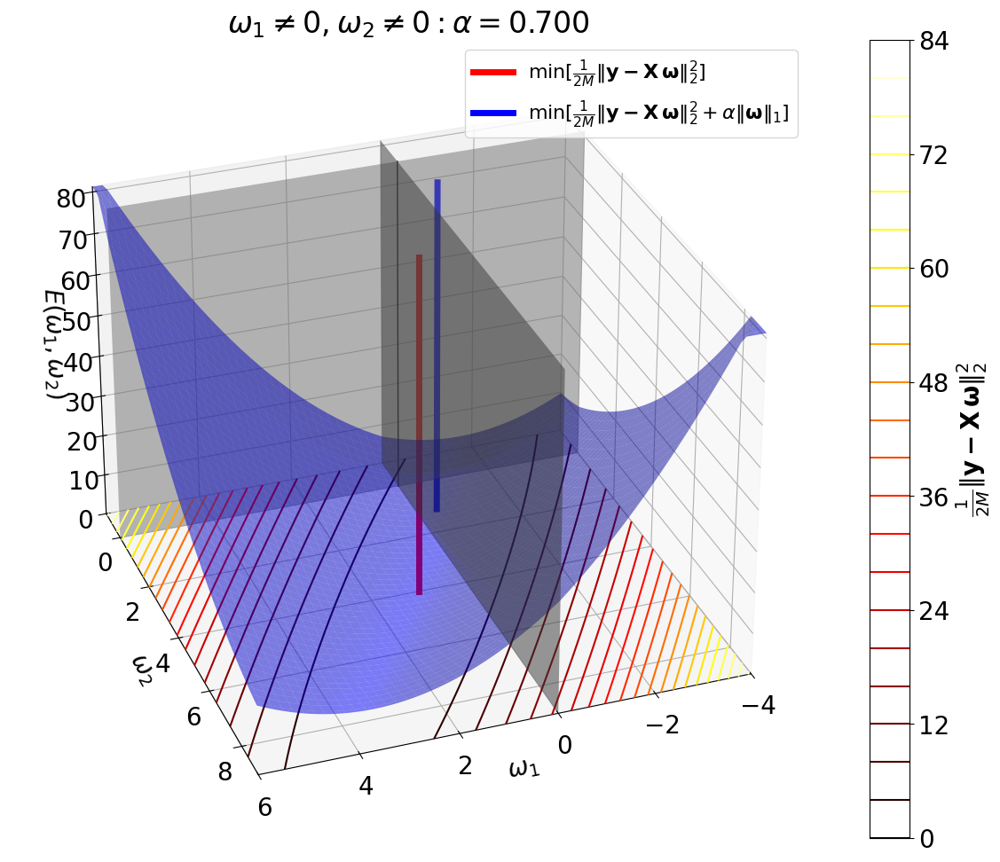

Xsub_mat      =  [[ 2 -1]
 [-1  1]]
omega_sub_hat =  [1. 4.]
100: omega1s = -4.000 -- +6.000
100: omega2s = -1.000 -- +9.000
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +1.000, j = +4.000


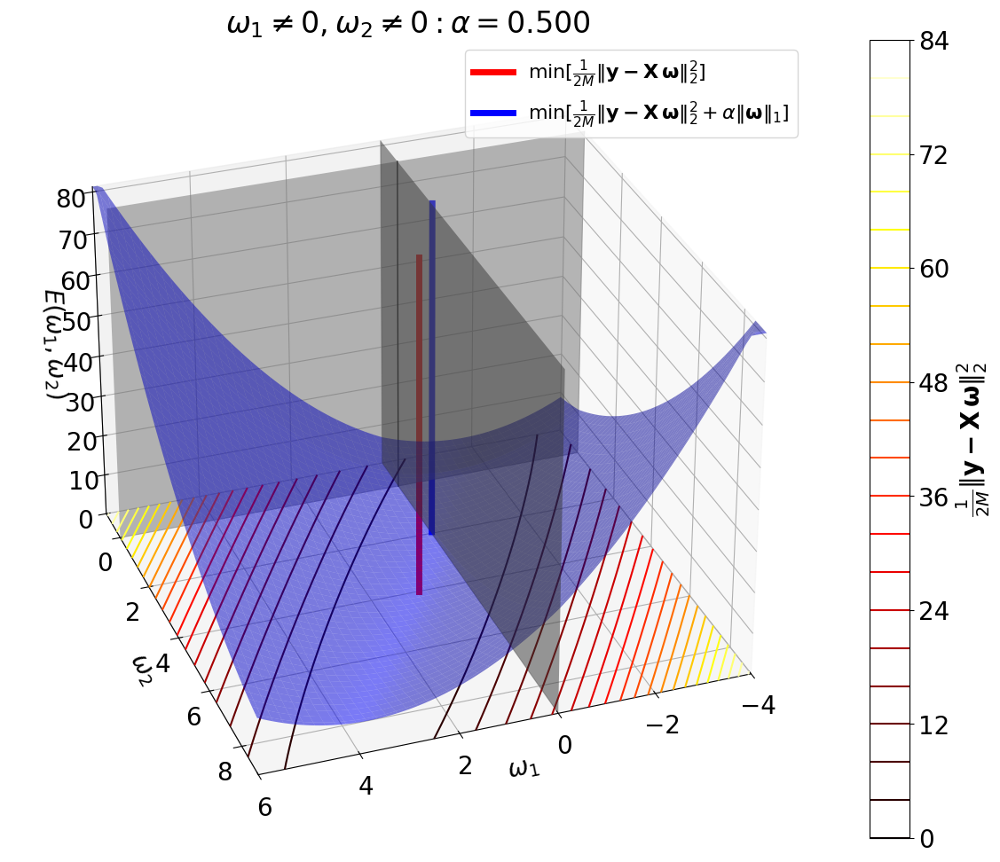

Xsub_mat      =  [[ 2 -1]
 [-1  1]]
omega_sub_hat =  [1. 4.]
100: omega1s = -4.000 -- +6.000
100: omega2s = -1.000 -- +9.000
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +1.000, j = +4.000


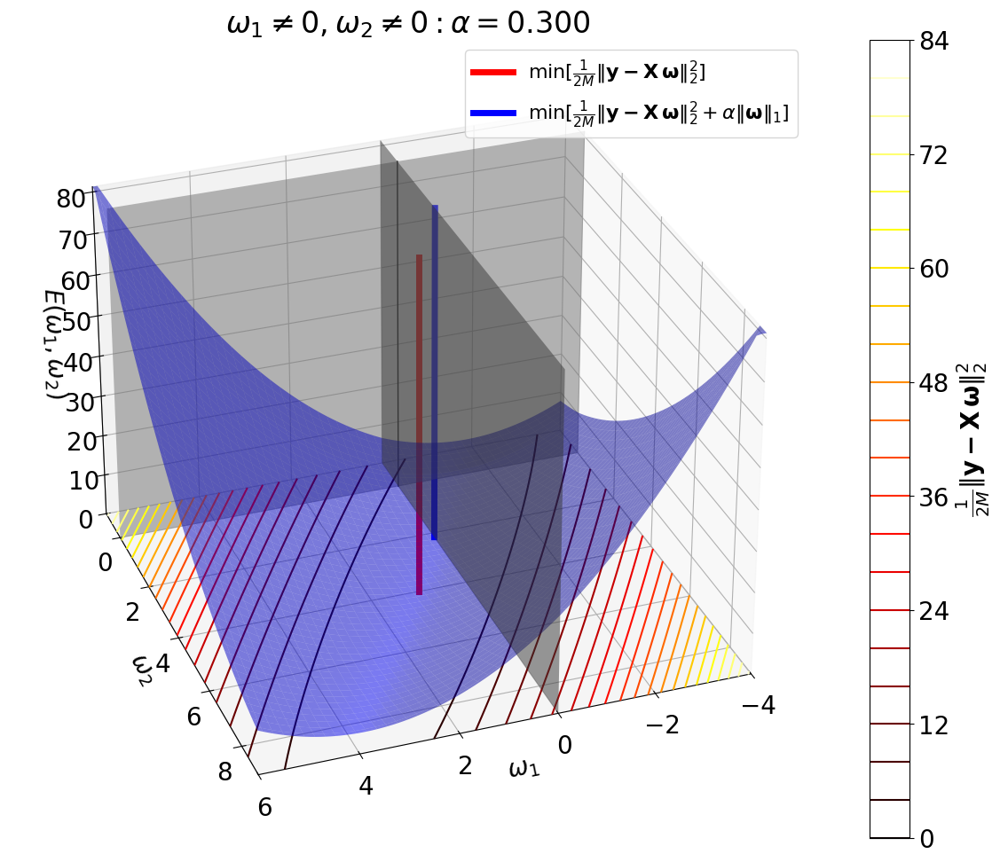

Xsub_mat      =  [[ 2 -1]
 [-1  1]]
omega_sub_hat =  [1. 4.]
100: omega1s = -4.000 -- +6.000
100: omega2s = -1.000 -- +9.000
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +1.000, j = +4.000


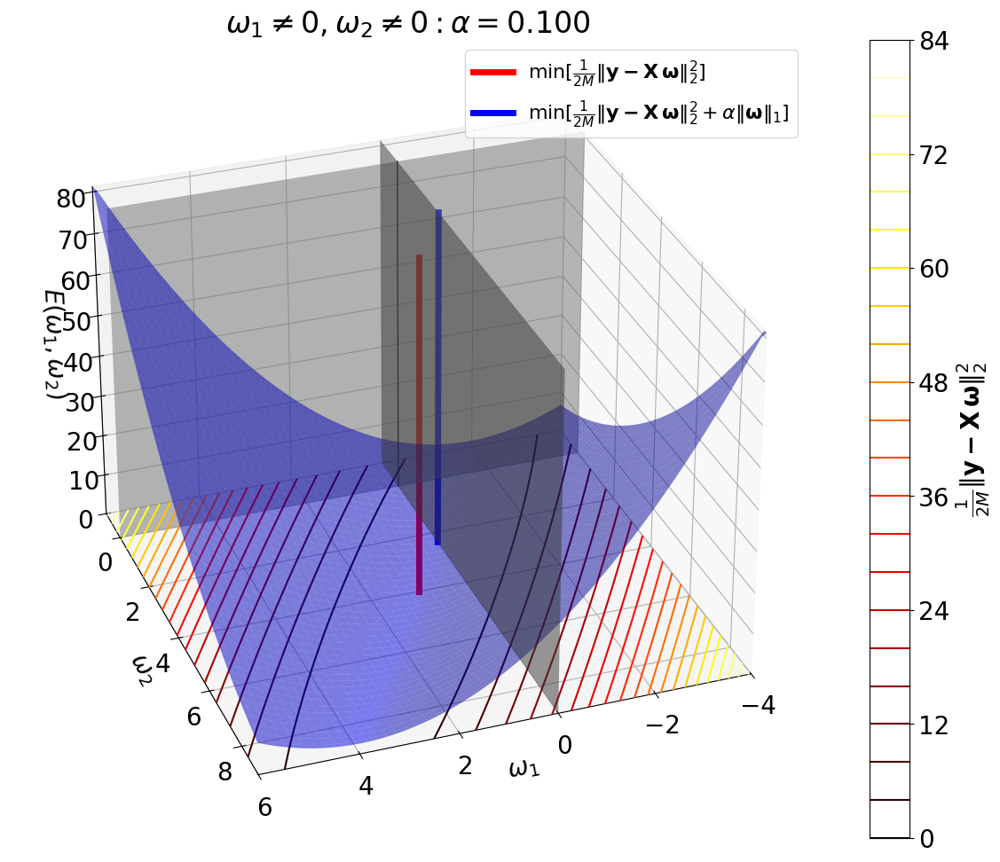

Xsub_mat      =  [[ 2 -1]
 [-1  1]]
omega_sub_hat =  [1. 4.]
100: omega1s = -4.000 -- +6.000
100: omega2s = -1.000 -- +9.000
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +1.000, j = +4.000


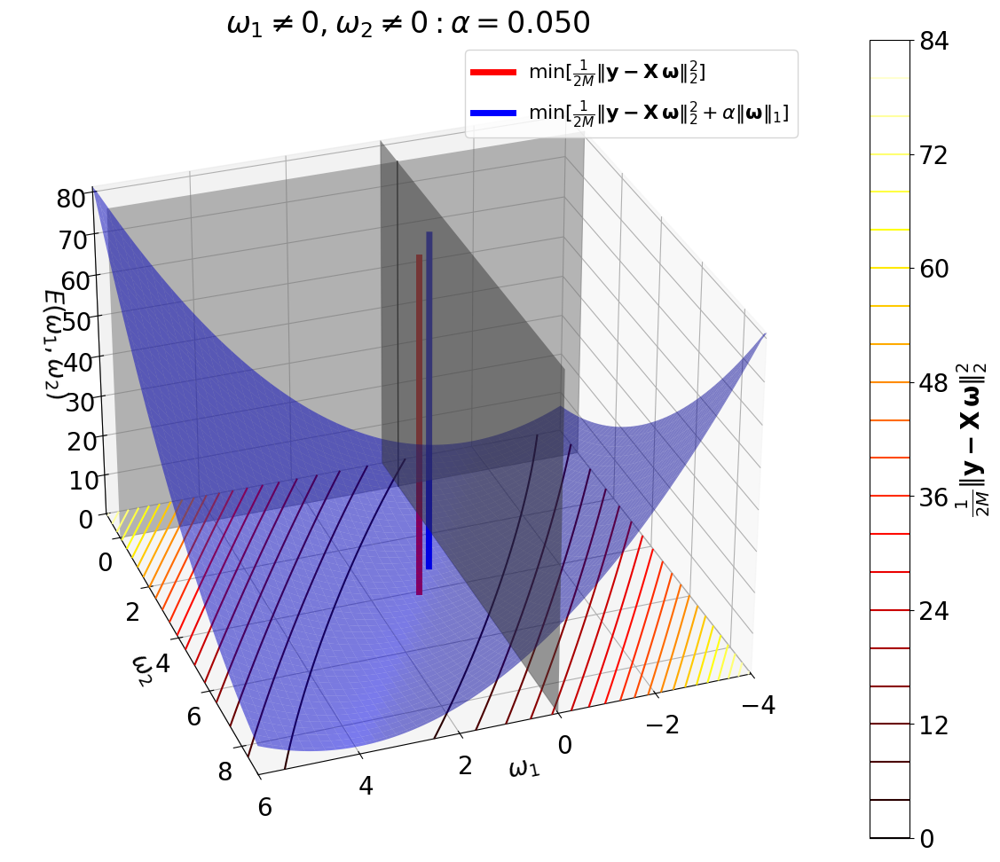

Xsub_mat      =  [[ 2 -1]
 [-1  1]]
omega_sub_hat =  [1. 4.]
100: omega1s = -4.000 -- +6.000
100: omega2s = -1.000 -- +9.000
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +1.000, j = +4.000


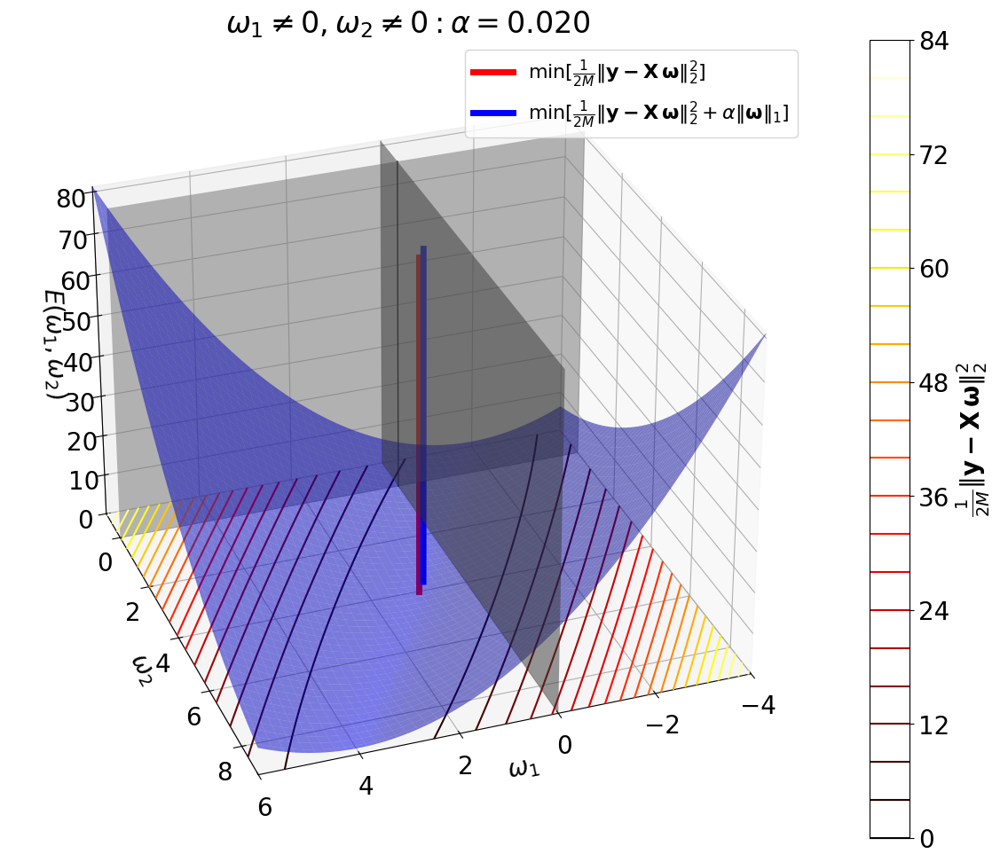

In [18]:
############################################
omega_sub_hat = omega12_hat
Xsub_mat      = X12_mat
############################################
alphas = [ 4, 1, 0.9, 0.7, 0.5, 0.3, 0.1, 0.05, 0.02]
############################################
# alpha = 0.02
for alpha in alphas:
  alpha_str = '%05d' % (alpha*100)
  #
  fig = Grf2D_omega_sub_LASSO( y_data, Xsub_mat, omega_sub_hat, alpha, '\omega_{1}', '\omega_{2}',
                               omega_sub_width = 5, omega_sub_len   = 100,
                               elev=30, azim=70 )
  #
  fig.savefig( FilePath + FileBaseName + '-omega12-alpha-%s.pdf' % alpha_str )

2-2.   L0=2となる解: $\omega_{1}\ne0$, $\omega_{2}0$, $\omega_{3}\ne0$

$$
\underbrace{
  \left(
    \begin{array}{c}
      y_{1} \\
      y_{2}
    \end{array}
  \right)
}_{\boldsymbol{y}}
=
\underbrace{
  \left(
    \begin{array}{cc}
      X_{11} & X_{13}\\
      X_{21} & X_{23}
    \end{array}
  \right)
}_{\mathbf{X}_{13}}
\underbrace{
  \left(
    \begin{array}{c}
      \omega_{1} \\
      \omega_{3}
    \end{array}
  \right)
}_{\boldsymbol{\omega}_{13}}
$$

$$
\hat{\boldsymbol{\omega}}_{13}
=
\mathbf{X}_{13}^{-1}
\boldsymbol{y}
$$

In [19]:
############################################
print( 'X_mat =\n', X_mat )
#
X13_mat = np.array( [X_mat[:,0], X_mat[:,2]] ).T
print( 'X13_mat =\n', X13_mat )
#
X13_mat_inv = np.linalg.inv( X13_mat )
#
omega13_hat = X13_mat_inv @ y_data
print( 'omega13_hat = ', omega13_hat )
#
y13_reg = X13_mat @ omega13_hat
print( 'y13_reg_err = ', y13_reg - y_data )

X_mat =
 [[ 2 -1  3]
 [-1  1  2]]
X13_mat =
 [[ 2  3]
 [-1  2]]
omega13_hat =  [-1.85714286  0.57142857]
y13_reg_err =  [2.22044605e-16 0.00000000e+00]


Xsub_mat      =  [[ 2  3]
 [-1  2]]
omega_sub_hat =  [-1.85714286  0.57142857]
100: omega1s = -6.857 -- +3.143
100: omega2s = -4.429 -- +5.571
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = -1.857, j = +0.571


<>:11: SyntaxWarning: invalid escape sequence '\o'
<>:11: SyntaxWarning: invalid escape sequence '\o'
<>:11: SyntaxWarning: invalid escape sequence '\o'
<>:11: SyntaxWarning: invalid escape sequence '\o'
C:\Users\iakai\AppData\Local\Temp\ipykernel_43696\1991951782.py:11: SyntaxWarning: invalid escape sequence '\o'
  fig = Grf2D_omega_sub_LASSO( y_data, Xsub_mat, omega_sub_hat, alpha, '\omega_{1}', '\omega_{3}',
C:\Users\iakai\AppData\Local\Temp\ipykernel_43696\1991951782.py:11: SyntaxWarning: invalid escape sequence '\o'
  fig = Grf2D_omega_sub_LASSO( y_data, Xsub_mat, omega_sub_hat, alpha, '\omega_{1}', '\omega_{3}',


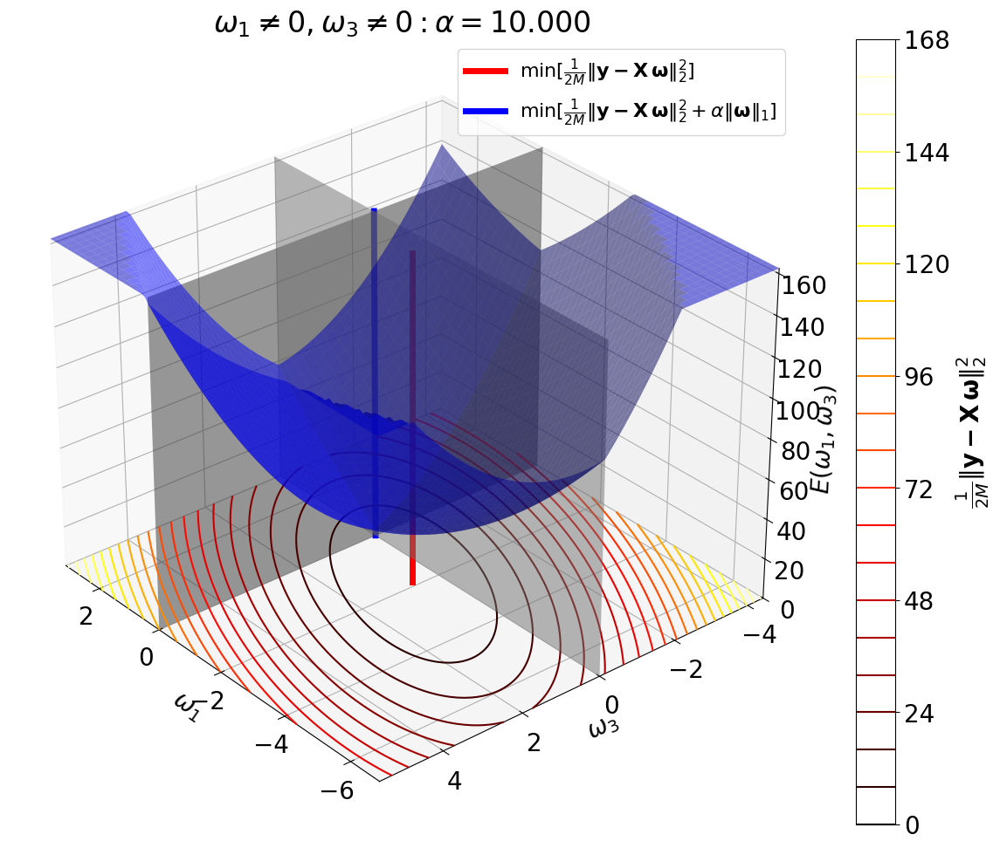

Xsub_mat      =  [[ 2  3]
 [-1  2]]
omega_sub_hat =  [-1.85714286  0.57142857]
100: omega1s = -6.857 -- +3.143
100: omega2s = -4.429 -- +5.571
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = -1.857, j = +0.571


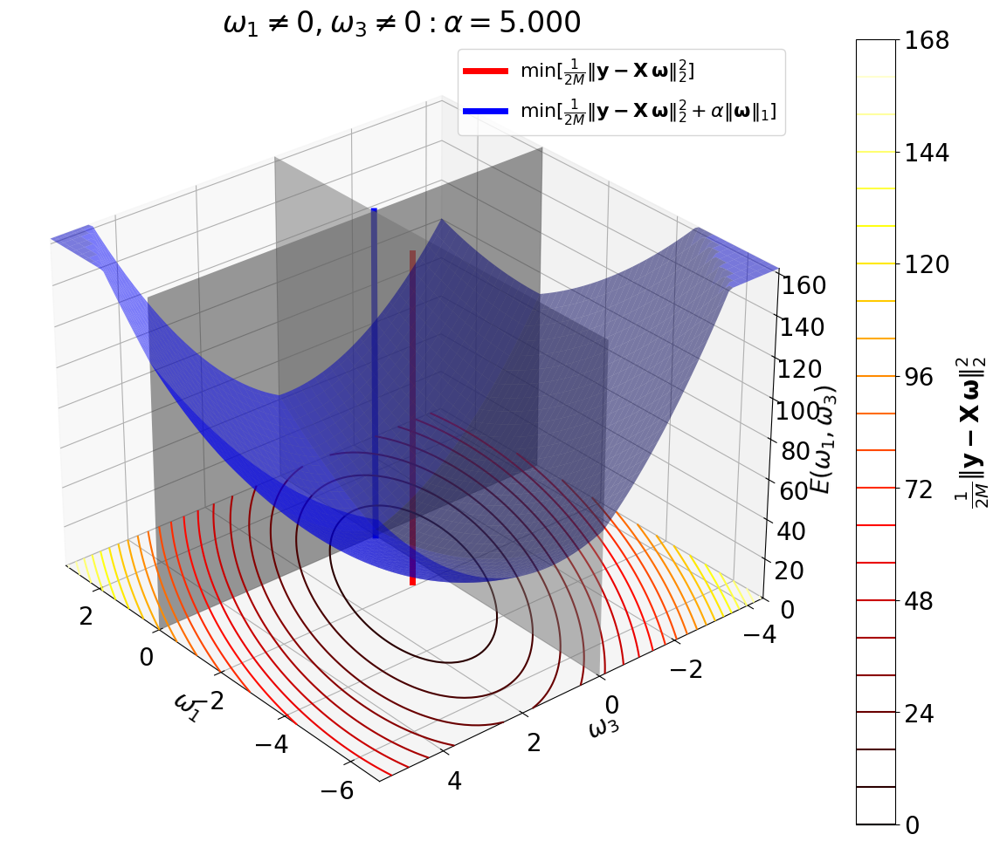

Xsub_mat      =  [[ 2  3]
 [-1  2]]
omega_sub_hat =  [-1.85714286  0.57142857]
100: omega1s = -6.857 -- +3.143
100: omega2s = -4.429 -- +5.571
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = -1.857, j = +0.571


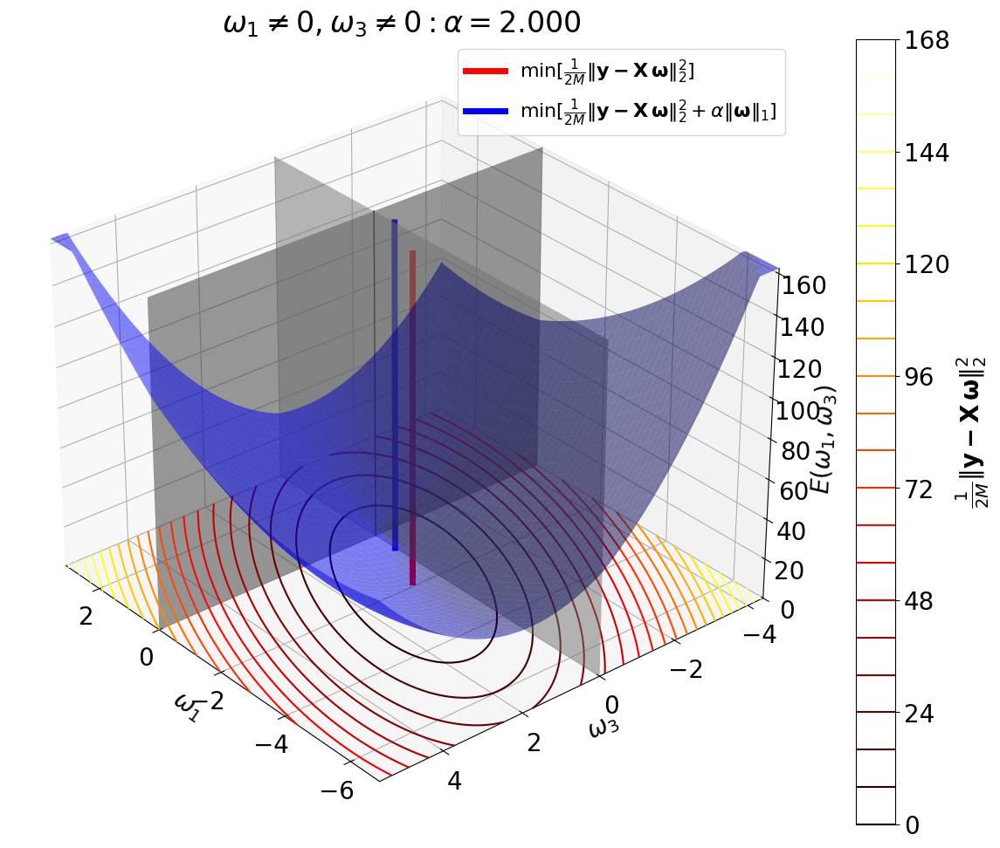

Xsub_mat      =  [[ 2  3]
 [-1  2]]
omega_sub_hat =  [-1.85714286  0.57142857]
100: omega1s = -6.857 -- +3.143
100: omega2s = -4.429 -- +5.571
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = -1.857, j = +0.571


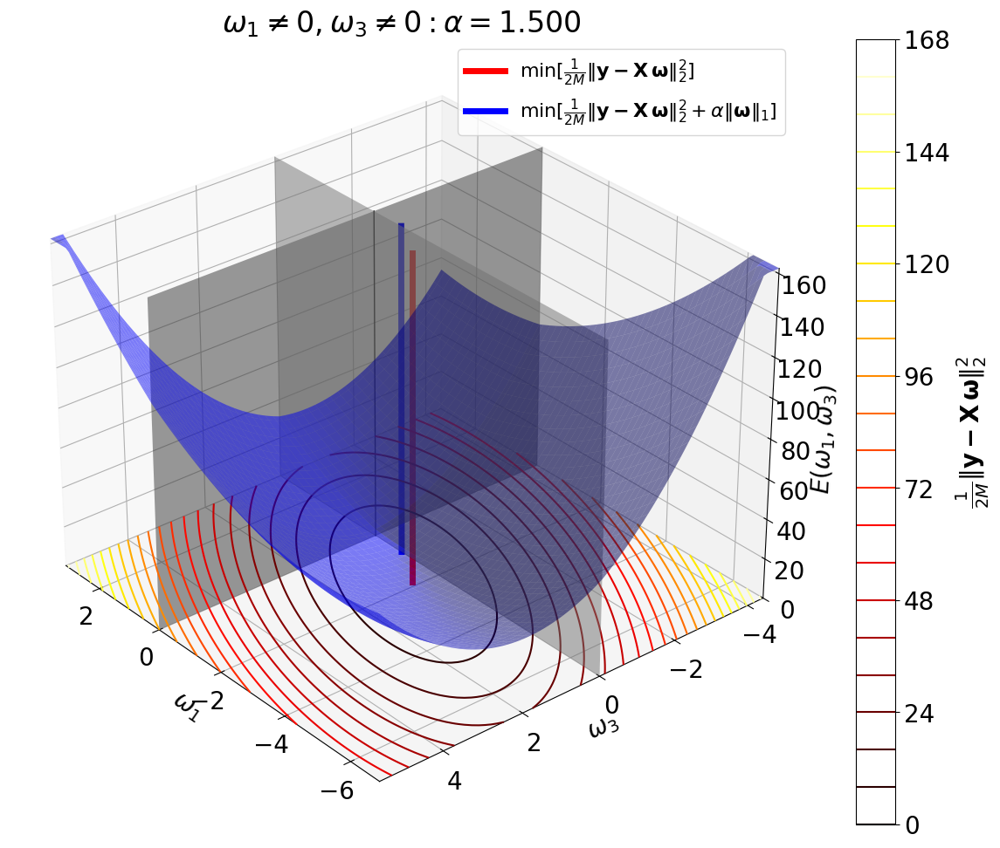

Xsub_mat      =  [[ 2  3]
 [-1  2]]
omega_sub_hat =  [-1.85714286  0.57142857]
100: omega1s = -6.857 -- +3.143
100: omega2s = -4.429 -- +5.571
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = -1.857, j = +0.571


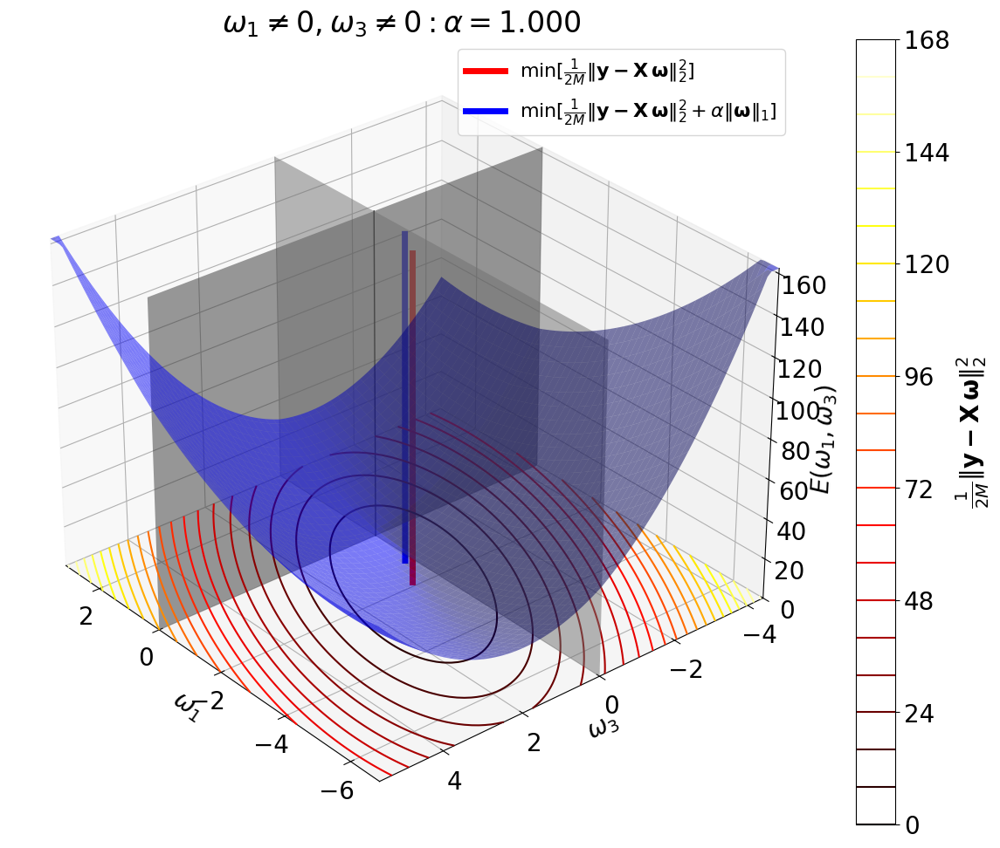

Xsub_mat      =  [[ 2  3]
 [-1  2]]
omega_sub_hat =  [-1.85714286  0.57142857]
100: omega1s = -6.857 -- +3.143
100: omega2s = -4.429 -- +5.571
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = -1.857, j = +0.571


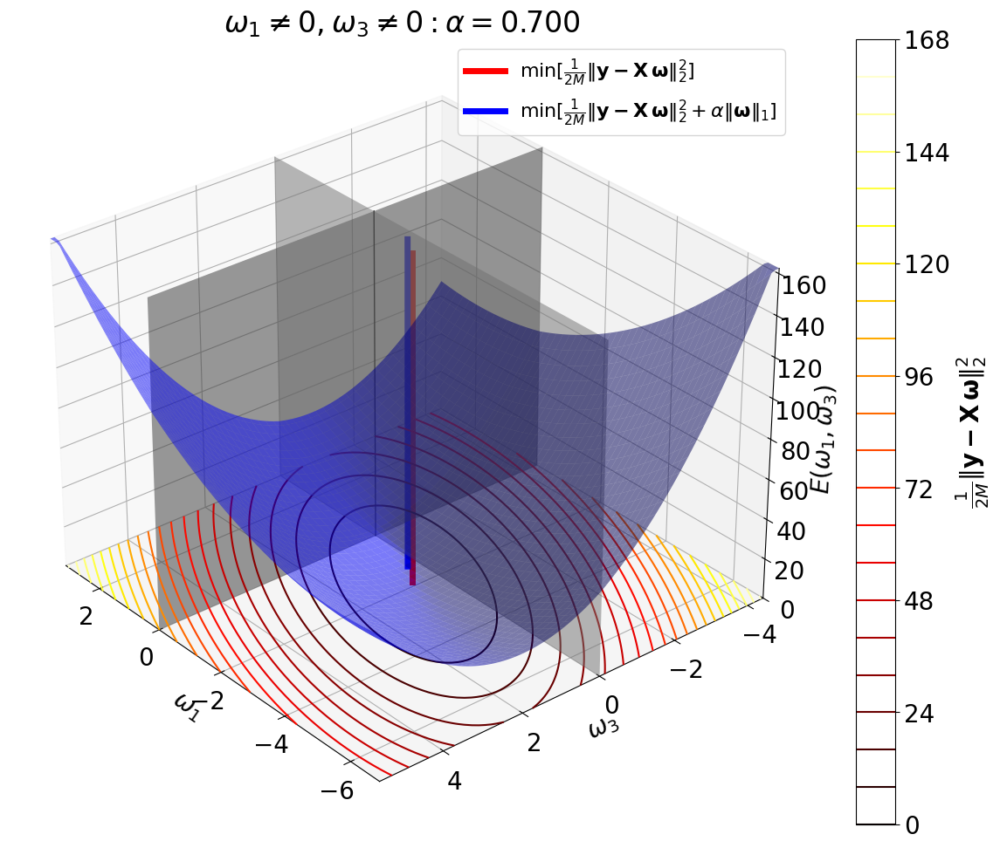

Xsub_mat      =  [[ 2  3]
 [-1  2]]
omega_sub_hat =  [-1.85714286  0.57142857]
100: omega1s = -6.857 -- +3.143
100: omega2s = -4.429 -- +5.571
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = -1.857, j = +0.571


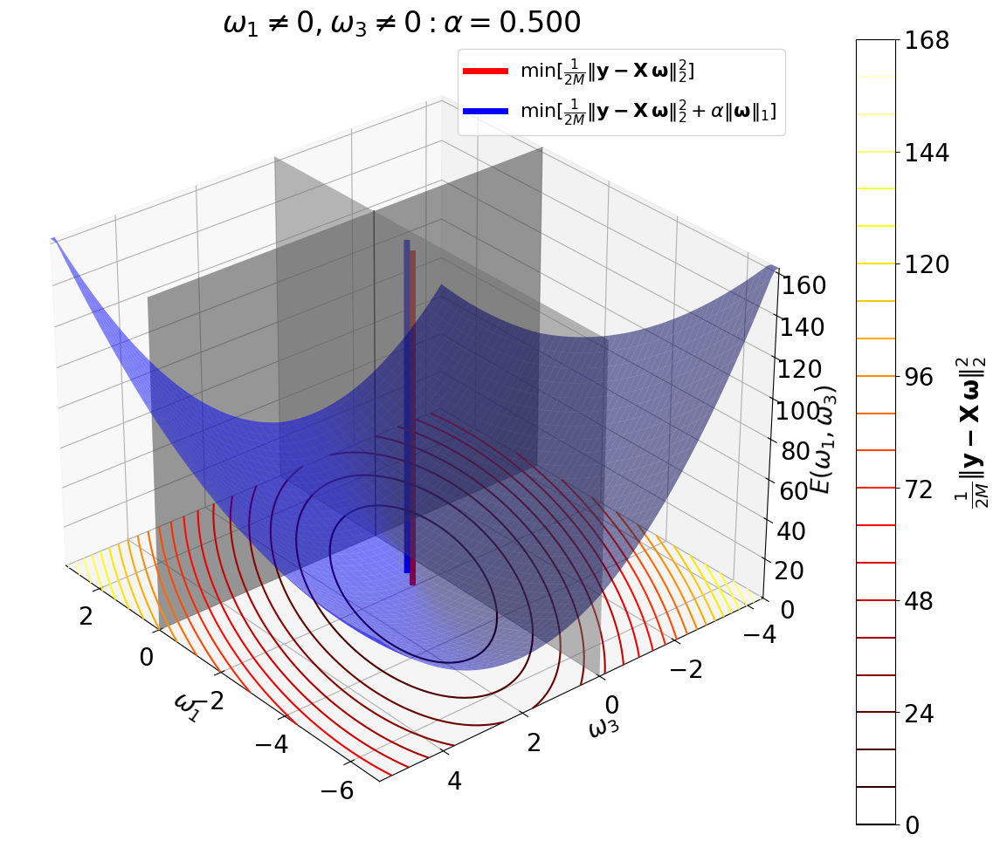

Xsub_mat      =  [[ 2  3]
 [-1  2]]
omega_sub_hat =  [-1.85714286  0.57142857]
100: omega1s = -6.857 -- +3.143
100: omega2s = -4.429 -- +5.571
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = -1.857, j = +0.571


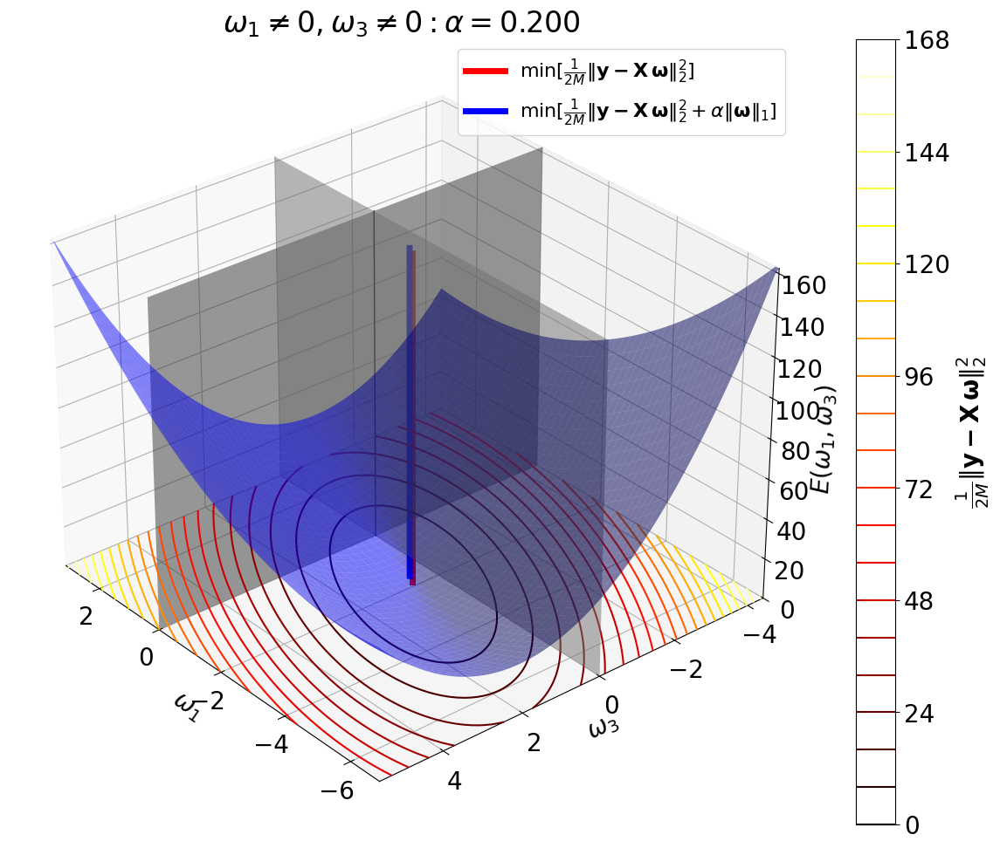

Xsub_mat      =  [[ 2  3]
 [-1  2]]
omega_sub_hat =  [-1.85714286  0.57142857]
100: omega1s = -6.857 -- +3.143
100: omega2s = -4.429 -- +5.571
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = -1.857, j = +0.571


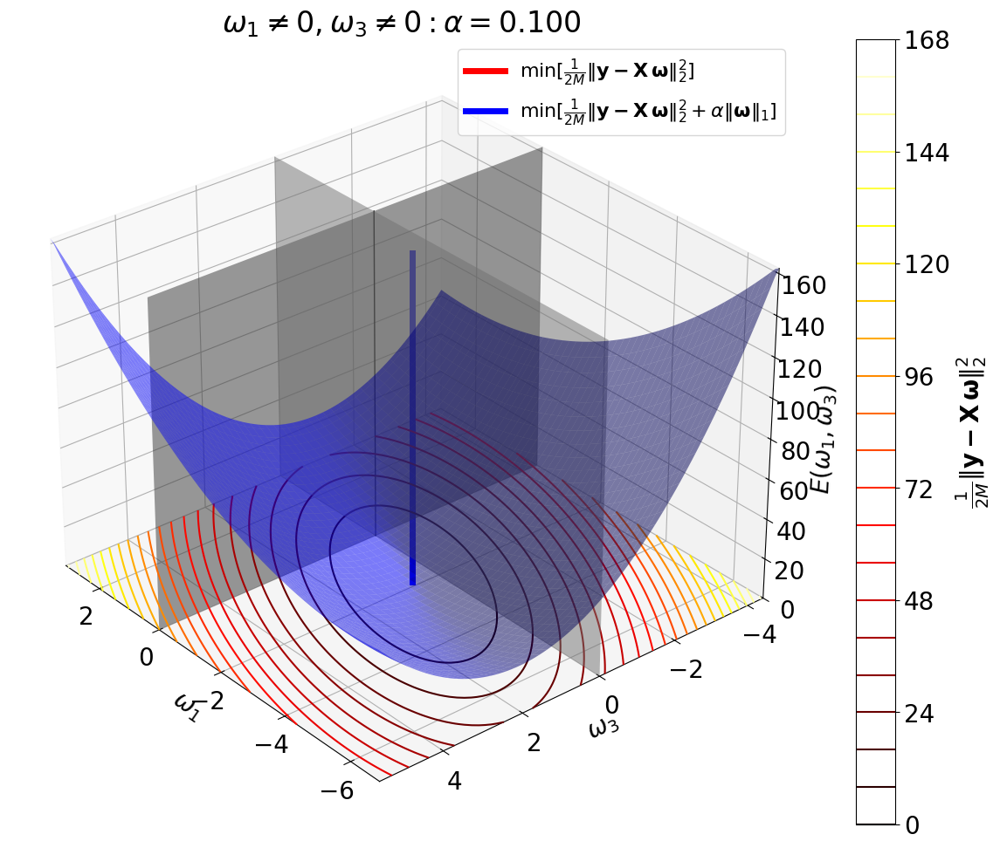

In [20]:
############################################
omega_sub_hat = omega13_hat
Xsub_mat      = X13_mat
############################################
alphas = [ 10, 5, 2, 1.5, 1, 0.7, 0.5, 0.2, 0.1]
############################################
# alpha = 0.02
for alpha in alphas:
  alpha_str = '%05d' % (alpha*100)
  #
  fig = Grf2D_omega_sub_LASSO( y_data, Xsub_mat, omega_sub_hat, alpha, '\omega_{1}', '\omega_{3}',
                               omega_sub_width = 5, omega_sub_len   = 100,
                               elev = 30, azim = 140 )
  #
  fig.savefig( FilePath + FileBaseName + '-omega13-alpha-%s.pdf' % alpha_str )

2-3.   L0=2となる解: $\omega_{1}=0$, $\omega_{2}\ne0$, $\omega_{3}\ne0$

$$
\underbrace{
  \left(
    \begin{array}{c}
      y_{1} \\
      y_{2}
    \end{array}
  \right)
}_{\boldsymbol{y}}
=
\underbrace{
  \left(
    \begin{array}{cc}
      X_{12} & X_{13}\\
      X_{22} & X_{23}
    \end{array}
  \right)
}_{\mathbf{X}_{23}}
\underbrace{
  \left(
    \begin{array}{c}
      \omega_{2} \\
      \omega_{3}
    \end{array}
  \right)
}_{\boldsymbol{\omega}_{23}}
$$

$$
\hat{\boldsymbol{\omega}}_{23}
=
\mathbf{X}_{23}^{-1}
\boldsymbol{y}
$$

In [21]:
############################################
print( 'X_mat =\n', X_mat )
#
X23_mat = np.array( [X_mat[:,1], X_mat[:,2]] ).T
print( 'X23_mat =\n', X23_mat )
#
X23_mat_inv = np.linalg.inv( X23_mat )
#
omega23_hat = X23_mat_inv @ y_data
print( 'omega23_hat = ', omega23_hat )
#
y23_reg = X23_mat @ omega23_hat
print( 'y23_reg_err = ', y23_reg - y_data )

X_mat =
 [[ 2 -1  3]
 [-1  1  2]]
X23_mat =
 [[-1  3]
 [ 1  2]]
omega23_hat =  [2.6 0.2]
y23_reg_err =  [0. 0.]


Xsub_mat      =  [[-1  3]
 [ 1  2]]
omega_sub_hat =  [2.6 0.2]
100: omega1s = -2.400 -- +7.600
100: omega2s = -4.800 -- +5.200
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +2.600, j = +0.200


<>:11: SyntaxWarning: invalid escape sequence '\o'
<>:11: SyntaxWarning: invalid escape sequence '\o'
<>:11: SyntaxWarning: invalid escape sequence '\o'
<>:11: SyntaxWarning: invalid escape sequence '\o'
C:\Users\iakai\AppData\Local\Temp\ipykernel_43696\4051326650.py:11: SyntaxWarning: invalid escape sequence '\o'
  fig = Grf2D_omega_sub_LASSO( y_data, Xsub_mat, omega_sub_hat, alpha, '\omega_{2}', '\omega_{3}',
C:\Users\iakai\AppData\Local\Temp\ipykernel_43696\4051326650.py:11: SyntaxWarning: invalid escape sequence '\o'
  fig = Grf2D_omega_sub_LASSO( y_data, Xsub_mat, omega_sub_hat, alpha, '\omega_{2}', '\omega_{3}',


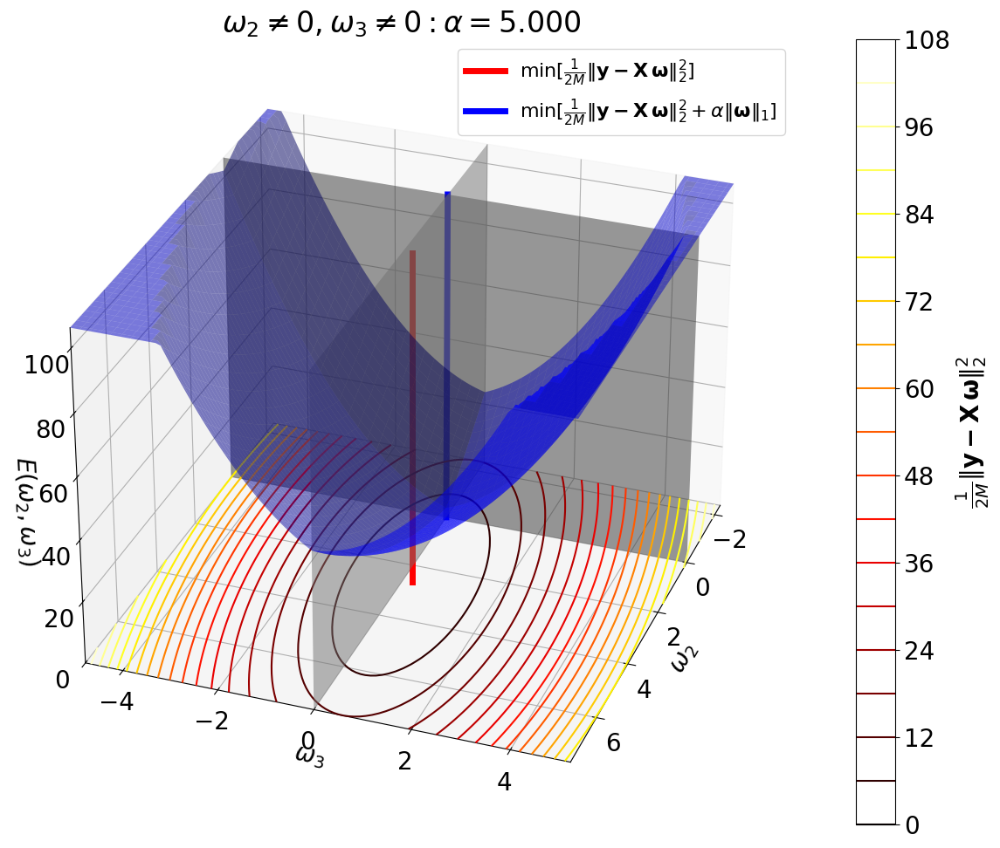

Xsub_mat      =  [[-1  3]
 [ 1  2]]
omega_sub_hat =  [2.6 0.2]
100: omega1s = -2.400 -- +7.600
100: omega2s = -4.800 -- +5.200
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +2.600, j = +0.200


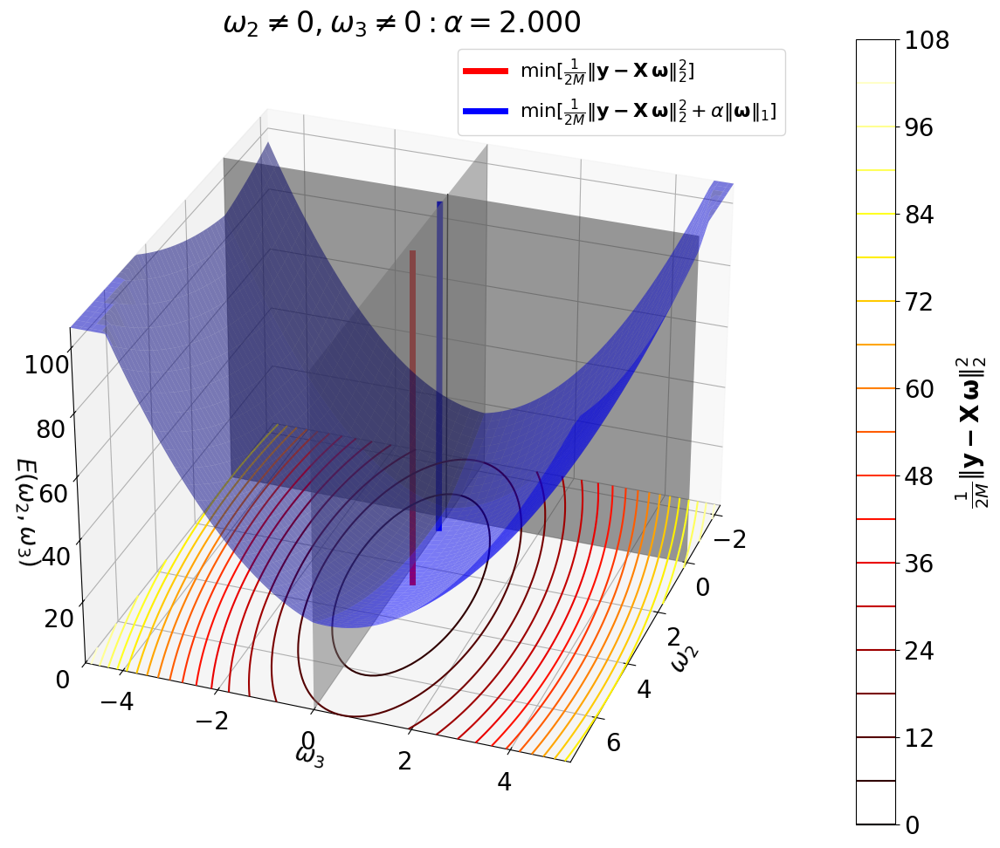

Xsub_mat      =  [[-1  3]
 [ 1  2]]
omega_sub_hat =  [2.6 0.2]
100: omega1s = -2.400 -- +7.600
100: omega2s = -4.800 -- +5.200
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +2.600, j = +0.200


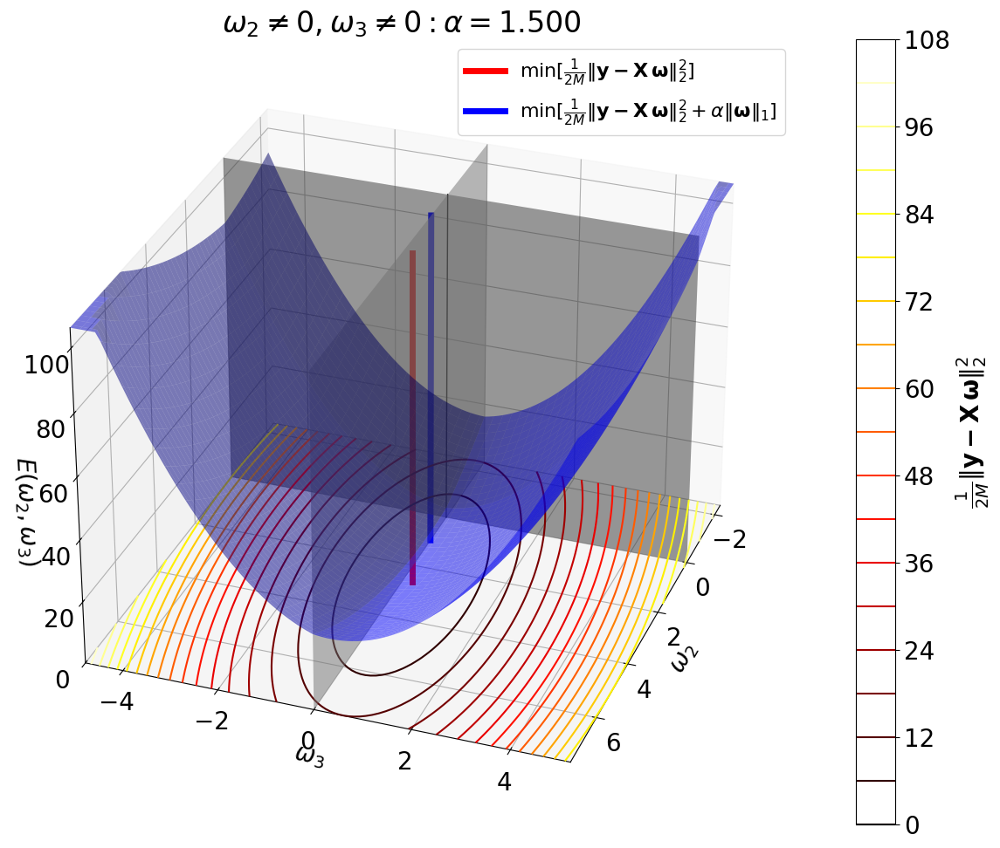

Xsub_mat      =  [[-1  3]
 [ 1  2]]
omega_sub_hat =  [2.6 0.2]
100: omega1s = -2.400 -- +7.600
100: omega2s = -4.800 -- +5.200
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +2.600, j = +0.200


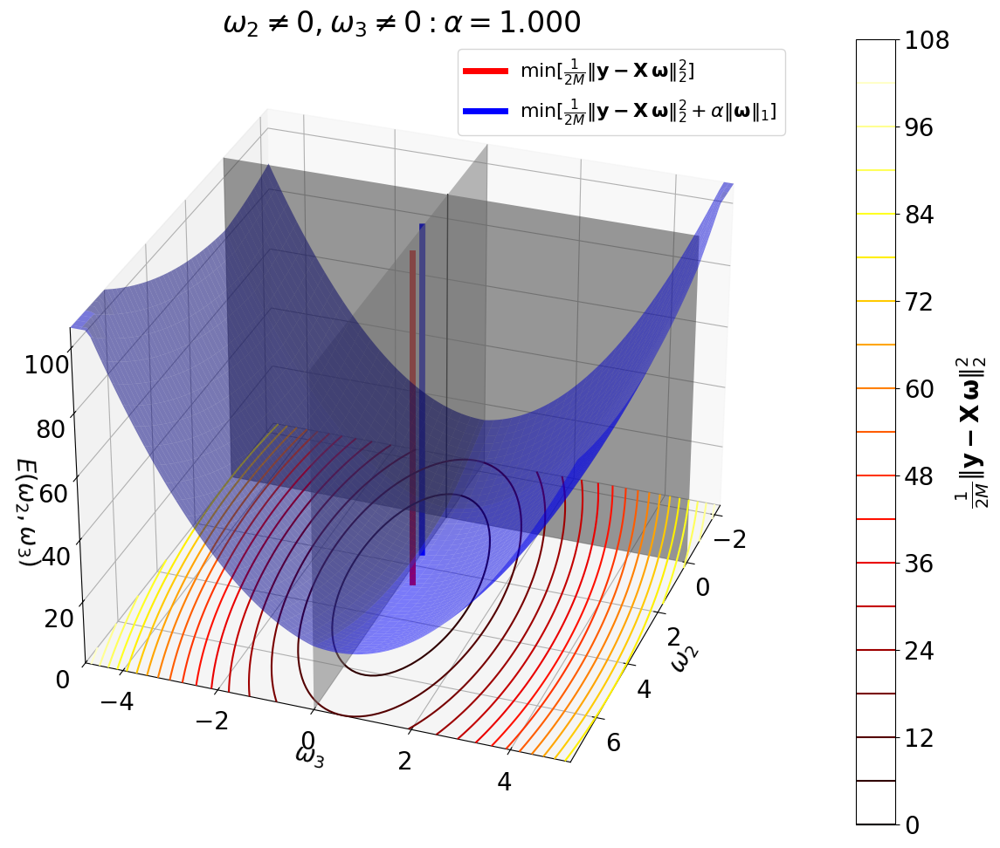

Xsub_mat      =  [[-1  3]
 [ 1  2]]
omega_sub_hat =  [2.6 0.2]
100: omega1s = -2.400 -- +7.600
100: omega2s = -4.800 -- +5.200
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +2.600, j = +0.200


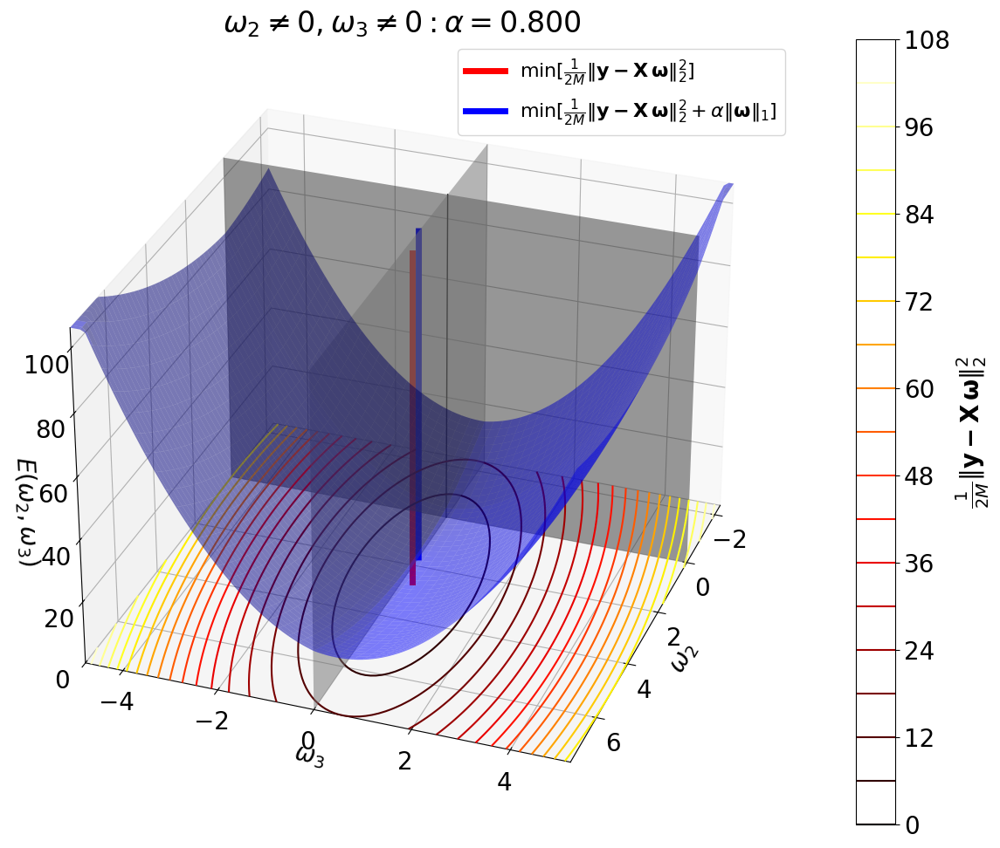

Xsub_mat      =  [[-1  3]
 [ 1  2]]
omega_sub_hat =  [2.6 0.2]
100: omega1s = -2.400 -- +7.600
100: omega2s = -4.800 -- +5.200
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +2.600, j = +0.200


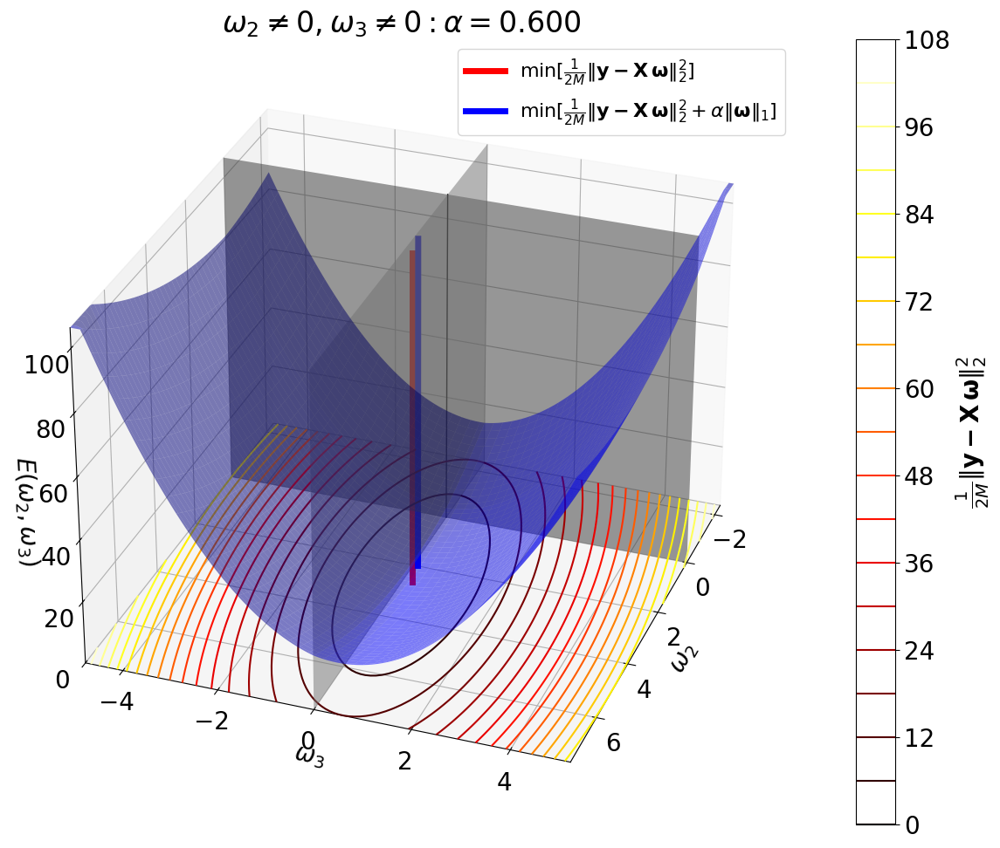

Xsub_mat      =  [[-1  3]
 [ 1  2]]
omega_sub_hat =  [2.6 0.2]
100: omega1s = -2.400 -- +7.600
100: omega2s = -4.800 -- +5.200
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +2.600, j = +0.200


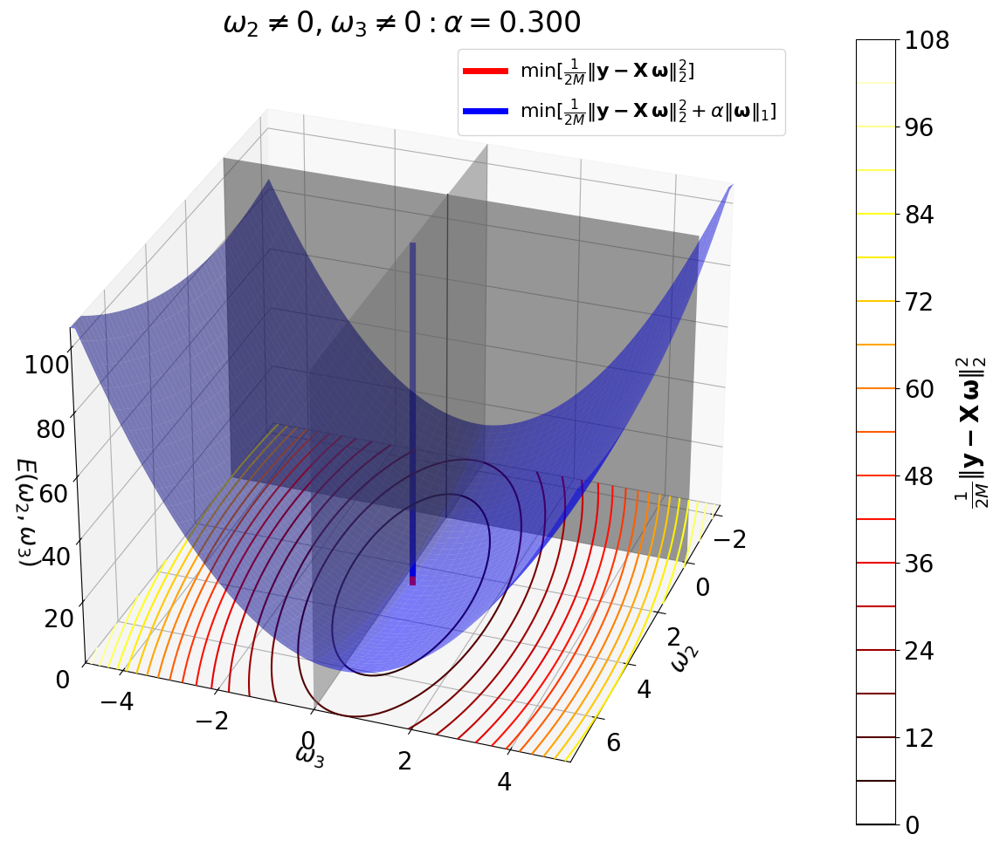

Xsub_mat      =  [[-1  3]
 [ 1  2]]
omega_sub_hat =  [2.6 0.2]
100: omega1s = -2.400 -- +7.600
100: omega2s = -4.800 -- +5.200
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +2.600, j = +0.200


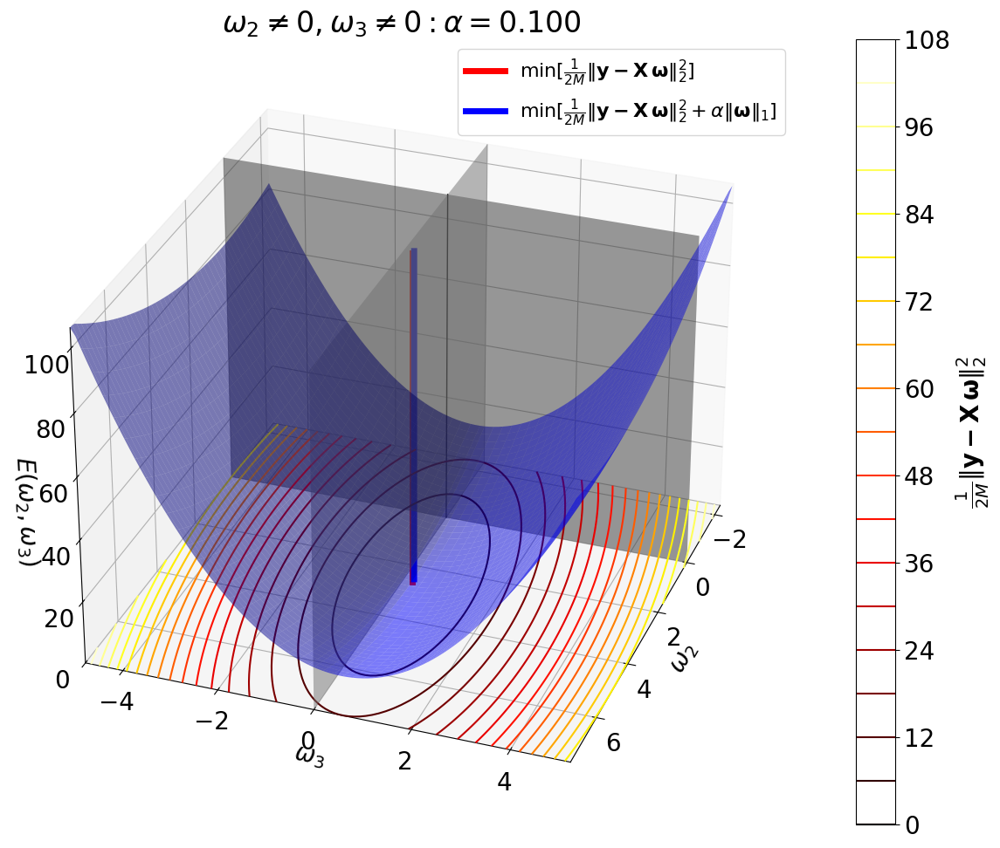

Xsub_mat      =  [[-1  3]
 [ 1  2]]
omega_sub_hat =  [2.6 0.2]
100: omega1s = -2.400 -- +7.600
100: omega2s = -4.800 -- +5.200
MIN(L1norm) = 0.000 @ i = +0.000, j = +0.000
MIN(Error) = 0.000 @ i = +2.600, j = +0.200


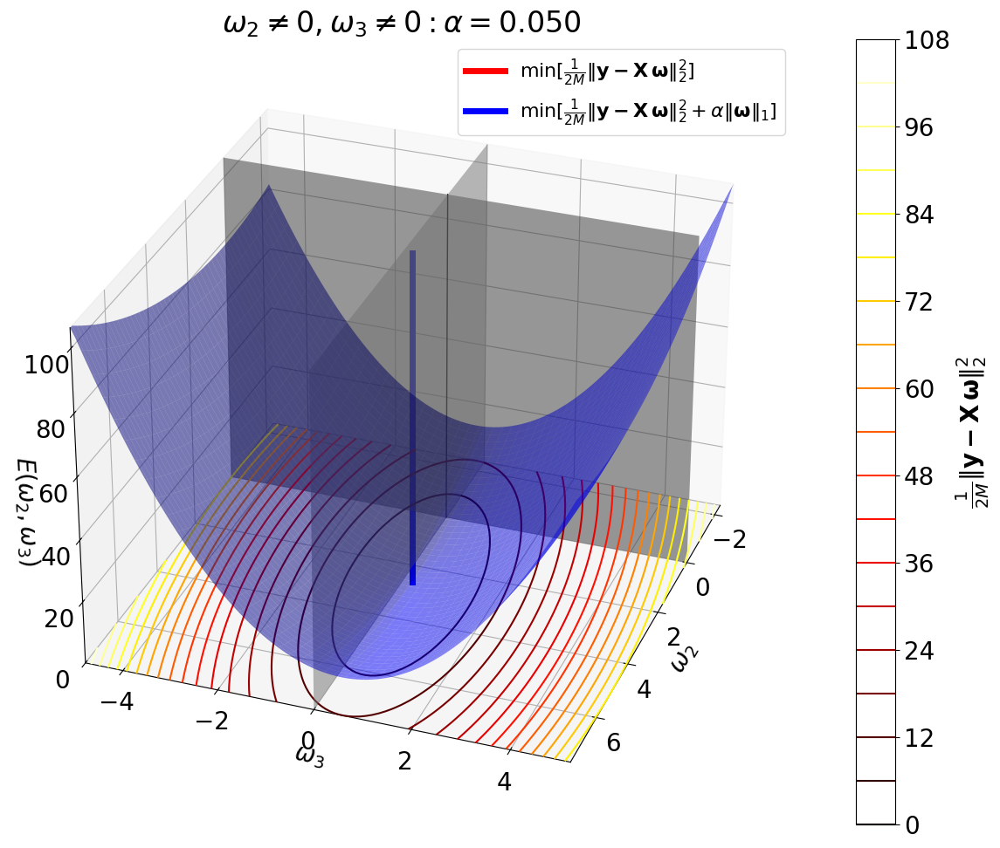

In [22]:
############################################
omega_sub_hat = omega23_hat
Xsub_mat      = X23_mat
############################################
alphas = [ 5, 2, 1.5, 1, 0.8, 0.6, 0.3, 0.1, 0.05]
############################################
# alpha = 0.02
for alpha in alphas:
  alpha_str = '%05d' % (alpha*100)
  #
  fig = Grf2D_omega_sub_LASSO( y_data, Xsub_mat, omega_sub_hat, alpha, '\omega_{2}', '\omega_{3}',
                               omega_sub_width = 5, omega_sub_len   = 100,
                               elev = 30, azim = 20 )
  #
  fig.savefig( FilePath + FileBaseName + '-omega23-alpha-%s.pdf' % alpha_str )